In [1]:
import os
from pathlib import Path

# 取得當前工作目錄
current = Path(os.getcwd())

# 檢查當前目錄的父目錄名稱並執行相應操作
if current.name == 'Notebooks':
    print(f"Current Path: {current}")
elif current.name == 'test_notebooks' or current.name == 'AOI':
    # 切換到上層目錄
    os.chdir('../')
    # 更新 current 變量為新的工作目錄
    current = Path(os.getcwd())
    print(f"Updated Path: {current}")
else:
    print("No matching parent directory found.")
    
import cv2  # 用於讀取圖片
import numpy as np  # 用於數學運算
import matplotlib.pyplot as plt  # 用於圖形顯示
import pathlib

from mymodules.filter.basic_filters import get_lines_hough, equalized_image, image_binary, crop

Updated Path: /Users/xieweizhe/Desktop/MacCode/Digital-Image-Processing/Code/Notebooks


In [2]:
import datetime
now = datetime.datetime.now()
f"{now.date()}"

folder_path = pathlib.Path(r"/Users/xieweizhe/Desktop/MacCode/Digital-Image-Processing/Code/Resources/outputs/pdf")
folder_path = folder_path / f"{now.date()}"
folder_path.mkdir(parents=True, exist_ok=True) # 確保目錄存在，不存在則創建
folder_path.as_posix()

template_folder_path = folder_path / 'template'
template_folder_path.mkdir(parents=True, exist_ok=True)

import os
origin_image_folder = pathlib.Path(r"/Users/xieweizhe/Desktop/MacCode/Digital-Image-Processing/Code/Resources/Data/Exp_202401021_AUO")
origin_images = os.listdir(origin_image_folder.as_posix())
origin_images = [image for image in sorted(origin_images) if image[-4:]==".tif"]
origin_images

['6_1.tif']

In [3]:
image_number = 0
origin_image_path = origin_image_folder / origin_images[image_number]
origin_name = origin_image_path.name

from mymodules.image_manager import ImageManager

origin_im = ImageManager(origin_image_path.as_posix())


In [4]:
crop_params={'x1':1000,'x2': 1600, 'y1':0, 'y2':6299}

Image changed to Red channel


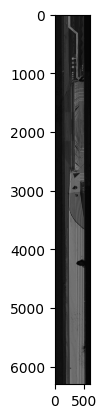

Image changed to Blue channel


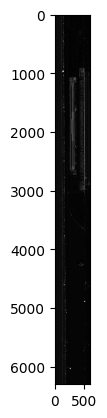

In [5]:
r_im = ImageManager(origin_image_path.as_posix())
r_im.choose_rgb('r')
r_im = r_im.process(crop, params=crop_params) # 9
r_im.show()

b_im = ImageManager(origin_image_path.as_posix())
b_im.choose_rgb('b')
b_im = b_im.process(crop, params=crop_params) # 9
b_im.show()

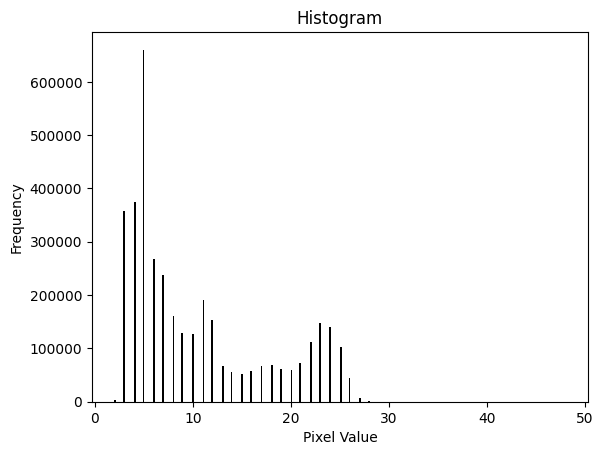

In [6]:
r_im.histogram_show()

In [7]:
r_im.basic_array_info(), b_im.basic_array_info()

Name: crop.tif
Folder: /Users/xieweizhe/Desktop/MacCode/Digital-Image-Processing/Code/Resources/Data/Exp_202401021_AUO
Type:  <class 'numpy.ndarray'>
Shape:  (6299, 600)
Max:  48
Min:  2
Mean:  10.481885749060698
Standard Deviation:  7.141619566407356
Name: crop.tif
Folder: /Users/xieweizhe/Desktop/MacCode/Digital-Image-Processing/Code/Resources/Data/Exp_202401021_AUO
Type:  <class 'numpy.ndarray'>
Shape:  (6299, 600)
Max:  255
Min:  0
Mean:  10.79676483039636
Standard Deviation:  14.104116592079992


(None, None)

Image changed to Blue channel


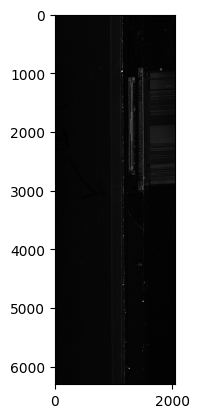

In [8]:
origin_im.choose_rgb('b')

origin_im.show()

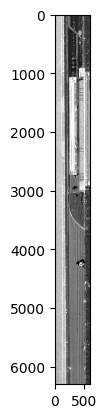

In [10]:
eb_im = b_im.process(equalized_image)
eb_im.show()

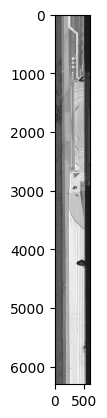

In [11]:
er_im = r_im.process(equalized_image)
er_im.show()

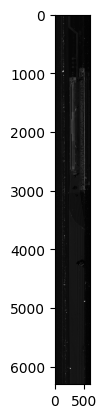

In [12]:
plt.imshow(b_im.image.astype(np.int16) + r_im.image.astype(np.int16), cmap='gray')

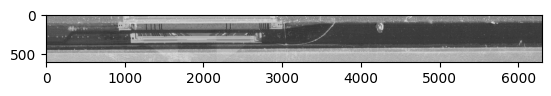

In [23]:
image = eb_im.image.astype(np.int16) - er_im.image.astype(np.int16)
image = np.rot90(image)
plt.imshow(image, cmap='gray')

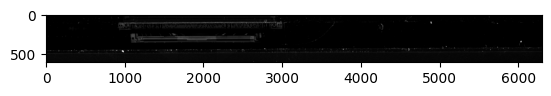

In [13]:
image = b_im.image.astype(np.float16) - r_im.image.astype(np.float16)*1
image = np.rot90(image)
image = np.clip(image, 0, 255)
plt.imshow(image, cmap='gray')

In [8]:
image = origin_im.image

In [9]:
image = b_im.image

In [10]:
image = origin_im.image

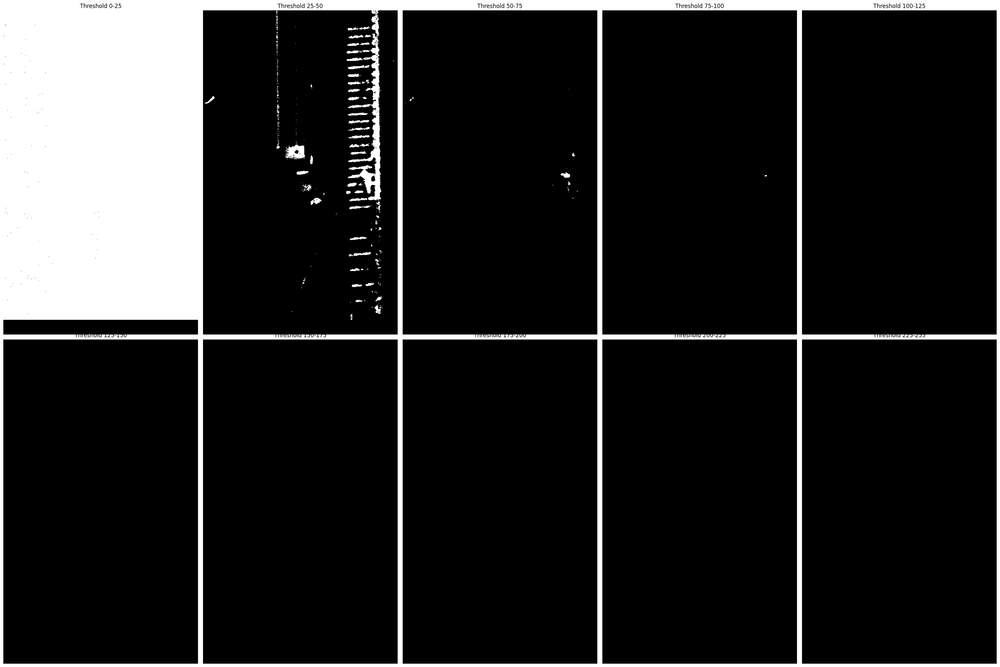

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# 設置每一行的列數和總行數
num = 10
columns = 5  # 每行的列數
rows = (num + columns - 1) // columns  # 確保所有子圖都能顯示

# 創建子圖
fig, axes = plt.subplots(rows, columns, figsize=(30, 10 * rows))
axes = axes.flatten()

# 計算每個等份的閾值範圍
min_val = 0
max_val = 255
step = (max_val - min_val) // num

# 分割圖像並顯示每個等份
for i in range(num):
    # 設置當前等份的閾值範圍
    lower_thresh = min_val + i * step
    upper_thresh = min_val + (i + 1) * step if i < num - 1 else max_val

    # 使用 cv2.threshold 將圖像切成等份
    _, segmented = cv2.threshold(image, lower_thresh, upper_thresh, cv2.THRESH_BINARY)

    # 顯示結果
    axes[i].imshow(segmented, cmap='gray')
    axes[i].set_title(f"Threshold {lower_thresh}-{upper_thresh}")
    axes[i].axis('off')

# 隱藏多餘的子圖（如果總數量不是子圖總數）
for j in range(num, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


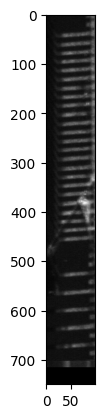

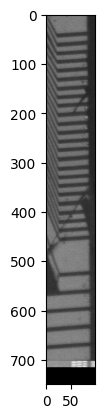

(None, None)

In [118]:
b_im.show(), r_im.show()

60.00213333333333 0 255


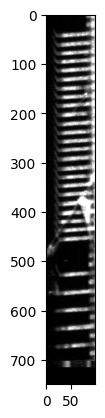

In [119]:
import numpy as np
import matplotlib.pyplot as plt

# 將影像從 int8 轉換為更大的數據類型以避免溢出問題
b_array = b_im.image.astype(np.int16)  # 或 np.float32
r_array = r_im.image.astype(np.int16)  # 或 np.float32

# 進行減法計算
t = np.clip(b_array*8 - r_array*2, 0, 255)

# 顯示計算結果的統計信息
print(t.mean(), t.min(), t.max())

# 顯示減法後的影像
plt.imshow(t, cmap='gray')
plt.show()


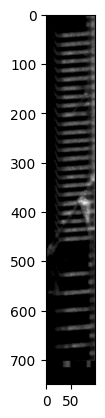

In [121]:
import numpy as np
import matplotlib.pyplot as plt

# 假設 b_im.image 和 r_im.image 是 NumPy 陣列
# 創建遮罩：當 r_im.image 的值大於 b_im.image 的值時，遮罩位置為 True
mask = r_im.image.astype(np.float64) > b_im.image.astype(np.float64)*2

# 使用遮罩將 b_im.image 對應的位置設為 0
blocked_image = np.where(mask, 0, b_im.image)

# 顯示結果
plt.imshow(blocked_image, cmap='gray')
plt.show()


In [122]:
blocked_image = blocked_image.astype(np.float16)
blocked_image = blocked_image *5

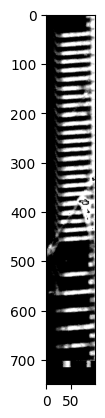

In [123]:
plt.imshow(equalized_image(blocked_image.astype(np.int8)), cmap='gray')

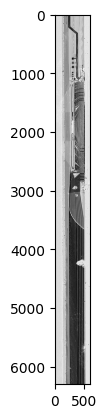

In [20]:
image = np.clip(b_im.image - r_im.image*10, 0, 255)
plt.imshow(image, cmap='gray')

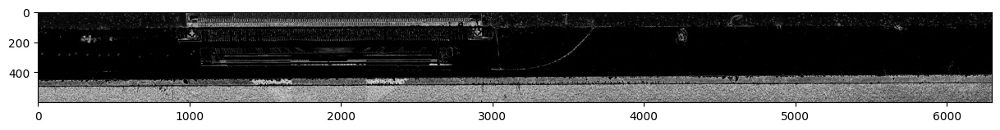

In [19]:
lower_thresh = 1
upper_thresh = 13

# 創建掩碼，保留在當前閾值區間內的像素，其他像素設為 0
mask = (image >= lower_thresh) & (image < upper_thresh)
segmented = np.zeros_like(image)
segmented[mask] = image[mask]

plt.figure(figsize=(15, 50))
plt.imshow(segmented, cmap='gray')

In [14]:
image = origin_im.image * 5

In [62]:
image = e_im.image

In [20]:
image = r_im.image * 5

In [32]:
image = b_im.image*1  - e_im.image
plt.imshow(image, cmap='gray')

NameError: name 'e_im' is not defined

In [50]:
image = t

In [93]:
image = blocked_image

In [ ]:
image = er_im

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# 設置每一行的列數和總行數
num = 50
columns = 1  # 每行的列數
rows = (num + columns - 1) // columns  # 確保所有子圖都能顯示

# 創建子圖
fig, axes = plt.subplots(rows, columns, figsize=(50, 5 * rows))
axes = axes.flatten()

# 計算每個等份的閾值範圍
min_val = 0
max_val = 255
step = (max_val - min_val) // num

# 分割圖像並顯示每個等份
for i in range(num):
    # 設置當前等份的閾值範圍
    lower_thresh = min_val + i * step
    upper_thresh = min_val + (i + 1) * step if i < num - 1 else max_val

    # 創建掩碼，保留在當前閾值區間內的像素，其他像素設為 0
    mask = (image >= lower_thresh) & (image < upper_thresh)
    segmented = np.zeros_like(image)
    segmented[mask] = image[mask]

    # 顯示結果
    axes[i].imshow(segmented, cmap='gray')
    axes[i].set_title(f"Threshold {lower_thresh}-{upper_thresh}")
    axes[i].axis('off')

# 隱藏多餘的子圖（如果總數量不是子圖總數）
for j in range(num, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()
